In [1]:
import pandas as pd
import json
import matplotlib.pyplot as plt
from collections import Counter

In [4]:
rclass_rank = {}


In [94]:
subgroup_data = {}
org_data = []
with open('./Archaea_table.tsv') as fh:
    header = fh.readline().strip()
    for l, line in enumerate(fh):
        line = line.strip().split('\t')
        msdb_id = line[0]
        json_fh = open(f'info/{msdb_id}_info.json', 'r')
        json_txt = json_fh.read()
        json_fh.close()
        
        msdb_info = json.loads(json_txt)['info']
        
        subgroup = line[7]
        rep_density = float(msdb_info['RepInfo']['PercentGenomeCovered'][:-1])
        
        org_data.append([line[1],subgroup])
        
        if subgroup in subgroup_data:
            subgroup_data[subgroup].append(rep_density)
        else: subgroup_data[subgroup] = [rep_density]
            
        rep_data = msdb_info['RepInfo']['PlotData']
#         top_lengths = []
#         top_rclasses = []
        rclass_base = {}
        rclass_freq = {}
        for rep_class in rep_data:
            total_bases = 0
            total_freq = 0
            if type(rep_data[rep_class]) == dict:
                for length in rep_data[rep_class]:
                    freq = sum(rep_data[rep_class][length])
                    total_bases += int(length)*freq
                    total_freq += freq
            rclass_base[rep_class] = total_bases
            rclass_freq[rep_class] = total_freq
        rclass_base = Counter(rclass_base)
        for i,rclass in enumerate(rclass_base.most_common()):
#             print(i,rclass)
            rclass = rclass[0] 
            if rclass not in rclass_rank:
                rclass_rank[rclass] = [0]
            else:
                rclass_rank[rclass].append(0)
            if i < 10: rclass_rank[rclass][-1] = 3
            elif i < 25: rclass_rank[rclass][-1] = 2
            elif i < 100: rclass_rank[rclass][-1] = 1
            elif i > 399: rclass_rank[rclass][-1] = -1
            if rclass_freq[rclass] < 5: rclass_rank[rclass][-1] = -2
        

In [95]:
out = open('Archaea_RnakMatrix.txt', 'w')
rclasses = sorted(list(rclass_rank.keys()))
header = ['subgroup'] + rclasses
print(*header, sep='\t', file=out)
for o, org in enumerate(org_data):
    subgroup = org[1]
    org = org[0]
    row = [subgroup]
    for rclass in rclasses:
        row.append(rclass_rank[rclass][o])
    print(*row, sep='\t', file=out)
out.close()

In [70]:
dft = pd.read_csv('./Archaea_table.tsv', sep = "\t")
df_org_subgrp = dft[['OrganismName','SubGroup']]
dft.head()

,MSDBID,OrganismName,CommonName,TaxID,Strain,Kingdom,Group,SubGroup,Size,GC,Annotation,AssemblyLevel,Source,Build,FilePrefix
0,MSDBG000175,Acidianus brierleyi,NaN,41673,strain=DSM 1651,Archaea,TACK group,Crenarchaeota,2.947,31.90,Y,Complete Genome,RefSeq,ASM320183v1,GCF_003201835.1_ASM320183v1
1,MSDBG000184,Acidiplasma aeolicum,NaN,507754,strain=VT,Archaea,Euryarchaeota,Diaforarchaea group,1.779,33.98,Y,Contig,RefSeq,ASM140294v1,GCF_001402945.1_ASM140294v1
2,MSDBG000185,Acidiplasma cupricumulans,NaN,312540,strain=BH2,Archaea,Euryarchaeota,Diaforarchaea group,1.731,34.17,Y,Contig,RefSeq,ASM140293v1,GCF_001402935.1_ASM140293v1
3,MSDBG000464,Aeropyrum pernix,NaN,56636,strain=YK1-12-2013,Archaea,TACK group,Crenarchaeota,1.601,56.48,Y,Scaffold,RefSeq,ASM432357v1,GCF_004323575.1_ASM432357v1
4,MSDBG000841,Archaeoglobus fulgidus,NaN,2234,NaN,Archaea,Euryarchaeota,Archaeoglobi,2.037,48.75,Y,Contig,RefSeq,ASM90006976v1,GCF_900069765.1_ASM90006976v1


In [83]:
df_ts = pd.read_csv("/home/ccmb/Desktop/Archaea_Analysis/RepeatClass_Rank.txt",sep="\t", header = None)
df_ts.set_index(0, inplace = True)
df_ts.head()

,1,2,3,4,5,6,7,8,9,10,...,1545,1546,1547,1548,1549,1550,1551,1552,1553,1554
0,,,,,,,,,,,,,,,,,,,,,
AAAAAT,3,3,3,-2,2,3,3,-2,3,3,...,-2,-2,-2,3,3,3,3,-2,3,3
AAAAT,3,3,3,-2,-2,3,-2,-2,-2,3,...,-2,-2,-2,3,3,-2,3,-2,3,2
AATAT,3,3,3,-2,-2,2,-2,-2,-2,-2,...,-2,-2,-2,-2,-2,-2,3,-2,-2,-2
AAATAT,3,3,3,-2,-2,3,-2,-2,-2,3,...,-2,-2,-2,-2,-2,-2,3,-2,-2,-2
AAATAG,3,2,2,-2,-2,2,-2,-2,-2,-2,...,-2,-2,-2,-2,2,-2,2,-2,-2,-2


In [84]:
df_ts.columns = df_org_subgrp['SubGroup']
df_ts.to_csv("/home/ccmb/Desktop/Archaea_Analysis/RepeatClass_org_Rank.txt")

In [86]:
d1 = pd.read_csv("/home/ccmb/Desktop/Archaea_Analysis/RepeatClass_org_Rank.txt", sep = ",")

# d1.reset_index(drop =True)
d1.set_index('0', inplace = True)
d1.head()

,Crenarchaeota,Diaforarchaea group,Diaforarchaea group.1,Crenarchaeota.1,Archaeoglobi,Crenarchaeota.2,Candidatus Bathyarchaeota,Stenosarchaea group,Candidatus Korarchaeota,Candidatus Micrarchaeota,...,Diaforarchaea group.403,Crenarchaeota.82,Crenarchaeota.83,archaeon ADurb.Bin336,archaeon MnTg01,Candidatus Woesearchaeota.37,Methanomada group.45,environmental samples,Thaumarchaeota.114,Diaforarchaea group.404
0,,,,,,,,,,,,,,,,,,,,,
AAAAAT,3,3,3,-2,2,3,3,-2,3,3,...,-2,-2,-2,3,3,3,3,-2,3,3
AAAAT,3,3,3,-2,-2,3,-2,-2,-2,3,...,-2,-2,-2,3,3,-2,3,-2,3,2
AATAT,3,3,3,-2,-2,2,-2,-2,-2,-2,...,-2,-2,-2,-2,-2,-2,3,-2,-2,-2
AAATAT,3,3,3,-2,-2,3,-2,-2,-2,3,...,-2,-2,-2,-2,-2,-2,3,-2,-2,-2
AAATAG,3,2,2,-2,-2,2,-2,-2,-2,-2,...,-2,-2,-2,-2,2,-2,2,-2,-2,-2


In [90]:
import plotly.express as px

fig1 = px.imshow(d1, height = 1400, width = 1200)
fig1.show()

In [96]:
dft = pd.read_csv('./Archaea_table.tsv', sep = "\t")


In [98]:
dft[dft['OrganismName'] == 'Euryarchaeota archaeon UBA39']

,MSDBID,OrganismName,CommonName,TaxID,Strain,Kingdom,Group,SubGroup,Size,GC,Annotation,AssemblyLevel,Source,Build,FilePrefix
710,MSDBG018694,Euryarchaeota archaeon UBA39,NaN,1915881,NaN,Archaea,Euryarchaeota,Diaforarchaea group,1.58,40.36,N,Scaffold,GenBank,ASM250304v1,GCA_002503045.1_ASM250304v1


In [41]:
out = open('./RepeatClass_Rank.txt', 'w')
for rclass in rclass_rank:
    print(rclass, *rclass_rank[rclass], sep='\t', file=out)


In [21]:
box_data = []
xlabels = []
for s in subgroup_data:
    if len(subgroup_data[s]) >= 10:
        xlabels.append(f'{s}({len(subgroup_data[s])})')
        box_data.append(subgroup_data[s])

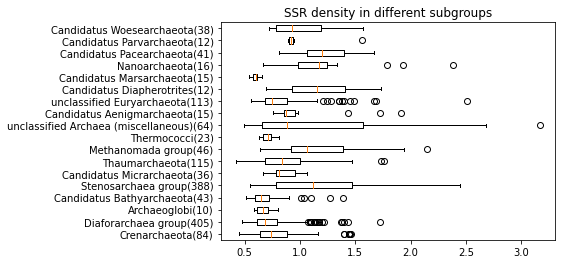

In [25]:
fig, ax = plt.subplots()
ax.set_title('SSR density in different subgroups')
ax.boxplot(box_data, vert=False)
ax.set_yticklabels(xlabels) #, rotation=90)
plt.show()

In [ ]:
# Ranking every motif in all speices based on its abundace.
# What are the finilised speices for Archaea. [ Currently : merge("NCBI" & "MSDB- 37k") ], havent looked into "MSDB_table".
# What are the species filtering factors here, previously done by [Assembly_level & Genome_size]

# I got clarity in how to proceed sequentialy in terms of Repeat_class - abundance and Highest_sequence_length.

